In [ ]:
!nvidia-smi

Fri Jul 31 09:20:19 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX TIT...  On   | 00000000:01:00.0  On |                  N/A |
| 22%   14C    P8    19W / 250W |    240MiB / 12209MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX TIT...  On   | 00000000:02:00.0 Off |                  N/A |
| 22%   13C    P8    19W / 250W |      1MiB / 12212MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

# Step 2: Cloning and Building Darknet
The following cells will clone darknet from AlexeyAB's famous repository, adjust the Makefile to enable OPENCV and GPU for darknet and then build darknet.

Do not worry about any warnings when you run the '!make' cell!

In [ ]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet
#!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 13939, done.
remote: Total 13939 (delta 0), reused 0 (delta 0), pack-reused 13939
Receiving objects: 100% (13939/13939), 12.42 MiB | 2.99 MiB/s, done.
Resolving deltas: 100% (9524/9524), done.


In [ ]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/home/billy/tesis_jose_martinez/darknet


In [ ]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2018 NVIDIA Corporation
Built on Sat_Aug_25_21:08:01_CDT_2018
Cuda compilation tools, release 10.0, V10.0.130


In [ ]:
# make darknet (build)
!make

# PASCAL VOC Dataset

### Download 2007

In [ ]:
!wget http://download1591.mediafire.com/oyn94f4shfkg/f9wmritnx9b5z7v/VOCtest_06-Nov-2007.tar

In [ ]:
!wget http://download1519.mediafire.com/angvc41phz6g/uehp16fwk3mjjuu/VOCtrainval_06-Nov-2007.tar

### Extract 2007

In [ ]:
!tar xf VOCtrainval_06-Nov-2007.tar

In [ ]:
!tar xf VOCtest_06-Nov-2007.tar

### Download 2012

In [ ]:
!wget http://download1641.mediafire.com/pm7qhkcqw36g/dduq74ljiw1ahga/VOCtrainval_11-May-2012.tar

### Extract 2012

In [ ]:
!tar xf VOCtrainval_11-May-2012.tar

### Transform to YOLO format

In [ ]:
!wget https://pjreddie.com/media/files/voc_label.py

In [ ]:
!python voc_label.py

### download ipynb to generate A.txt and B.txt files

In [ ]:
!wget http://download1481.mediafire.com/iirg98ivr6jg/cb7lsd6dppqrfgg/2012_split_A_B.ipynb

# Step 3: Download pretrained YOLOv3 weights
YOLOv3 has been trained already on the coco dataset which has 80 classes that it can predict. We will grab these pretrained weights so that we can run YOLOv3 on these pretrained classes and get detections.

In [ ]:
# get yolov3 pretrained coco dataset weights
!wget https://pjreddie.com/media/files/yolov3.weights

In [ ]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file  
def download(path):
  from google.colab import files
  files.download(path)

# Step 4: Run Detections with Darknet and YOLOv3

In [ ]:
# run darknet detection
!./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

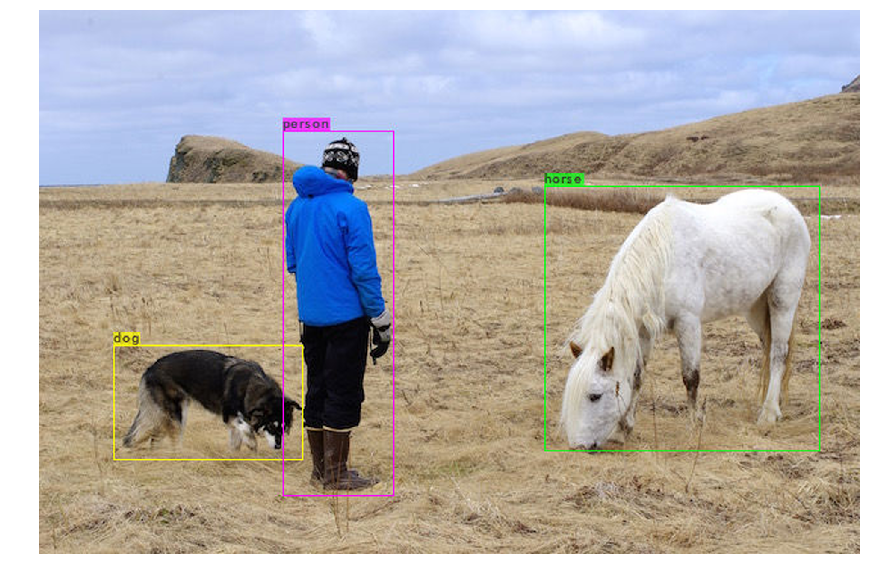

In [ ]:
# show image using our helper function
imShow('predictions.jpg')

In [ ]:
# look we can run another detection!
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg
imShow('predictions.jpg')

 WOW this is magic! Make sure to click this link to be blessed with lots of YOLOv3 luck!!!
 [https://www.youtube.com/channel/UCrydcKaojc44XnuXrfhlV8Q?sub_confirmation=1](https://www.youtube.com/channel/UCrydcKaojc44XnuXrfhlV8Q?sub_confirmation=1)

# Step 4: Download pre-trained weights for the convolutional layers.
This step downloads the weights for the convolutional layers of the YOLOv3 network. By using these weights it helps your custom object detector to be way more accurate and not have to train as long. You don't have to use these weights but trust me it will help your modle converge and be accurate way faster. USE IT!

In [ ]:
# upload pretrained convolutional layer weights
!wget http://pjreddie.com/media/files/darknet53.conv.74

## Nota sobre el training:
el error
```
Cannot load image /content/drive/My Drive/Colab Notebooks/darknet/data/cifar/train/31403_truck.png
```
y similares se debe a que drive tiene problemas para manejar tantos archivos y lograr copiar todos los archivos a la carpeta a sido imposible (he intentado con zip, con rar y subiendolos por algunos cientos de imagenes a la ves, lo que descarté debido a que tomaba mucho tiempo hacer eso).

Solución: Ubuntu


# Training

In [ ]:
# train your custom detector
!./darknet detector train cfg/voc.data cfg/yolov3-voc.cfg darknet53.conv.74 -dont_show -map -gpus 0,1

You can observe a chart of how your model did throughout the training process by running the below command. It shows a chart of your average loss vs. iterations. For your model to be 'accurate' you would aim for a loss under 2.

**TRICK**: If for some reason you get an error or your Colab goes idle during training, you have not lost your weights! Every 100 iterations a weights file called **yolov3_custom_last.weights** is saved to **mydrive/yolov3/backup/** folder (wherever your backup folder is). This is why we created this folder in our Google drive and not on the cloud VM. If your runtime crashes and your backup folder was in your cloud VM you would lose your weights and your training progress.

We can kick off training from our last saved weights file so that we don't have to restart! WOOHOO! Just run the following command but with your backup location.
```
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show
```

In [ ]:
!./darknet detector train data/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights -dont_show

In [ ]:
!./darknet detector train data/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights -dont_show

In [ ]:
imShow('chart.png')

# Step 6: Run Your Custom Object Detector!!!
You have done it! You now have a custom object detector to make your very own detections. Time to test it out and have some fun!

In [ ]:
# need to set our custom cfg to test mode 
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov3-voc.cfg
!sed -i 's/subdivisions=16/subdivisions=1/' yolov3-voc.cfg
%cd ..


/home/billy/tesis_jose_martinez/darknet/cfg
/home/billy/tesis_jose_martinez/darknet


 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

 104 conv    256       3 x 3/ 1     52 x  52 x 128 ->   52 x  52 x 256 1.595 BF
 105 conv     75       1 x 1/ 1     52 x  52 x 256 ->   52 x  52 x  75 0.104 BF
 106 yolo
[yolo] params: iou loss: mse (2), iou_norm: 0.75, cls_norm: 1.00, scale_x_y: 1.00
Total BFLOPS 65.442 
avg_outputs = 520504 
 Allocate additional workspace_size = 13.11 MB 
Loading weights from backup/yolov3-voc_last.weights...
 seen 64, trained: 3212 K-images (50 Kilo-batches_64) 
Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/dogs-close.jpg: Predicted in 22.339000 milli-seconds.
dog: 98%
Unable to init server: Could not connect: Connection refused

(predictions:1533): Gtk-WARNING **: 09:31:26.409: cannot open display: 


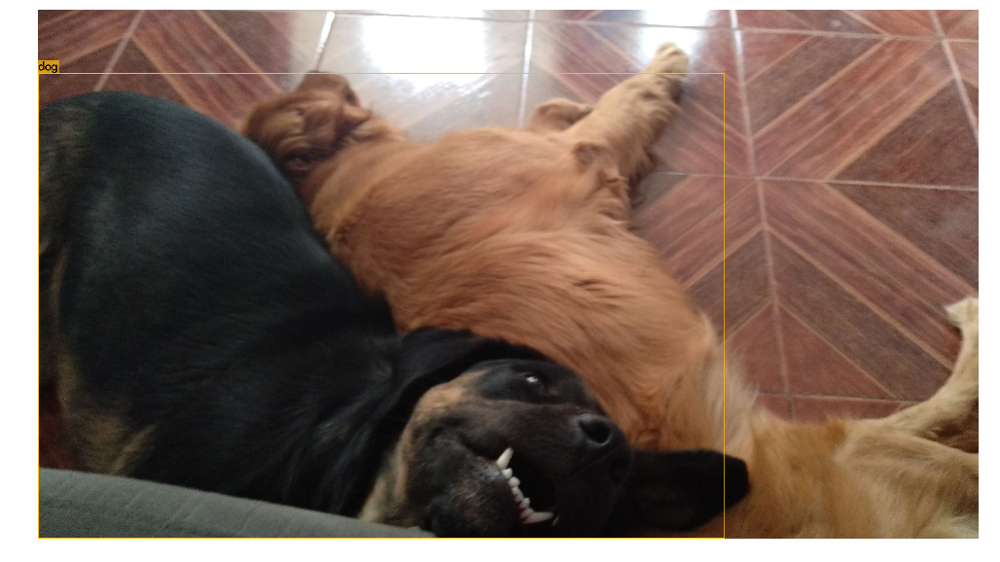

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/dogs-close.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/dogs-close-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/dogs-person.jpg: Predicted in 22.250000 milli-seconds.
dog: 94%
dog: 86%
person: 43%
person: 53%
car: 94%
car: 100%
Unable to init server: Could not connect: Connection refused

(predictions:1565): Gtk-WARNING **: 09:32:06.512: cannot open display: 


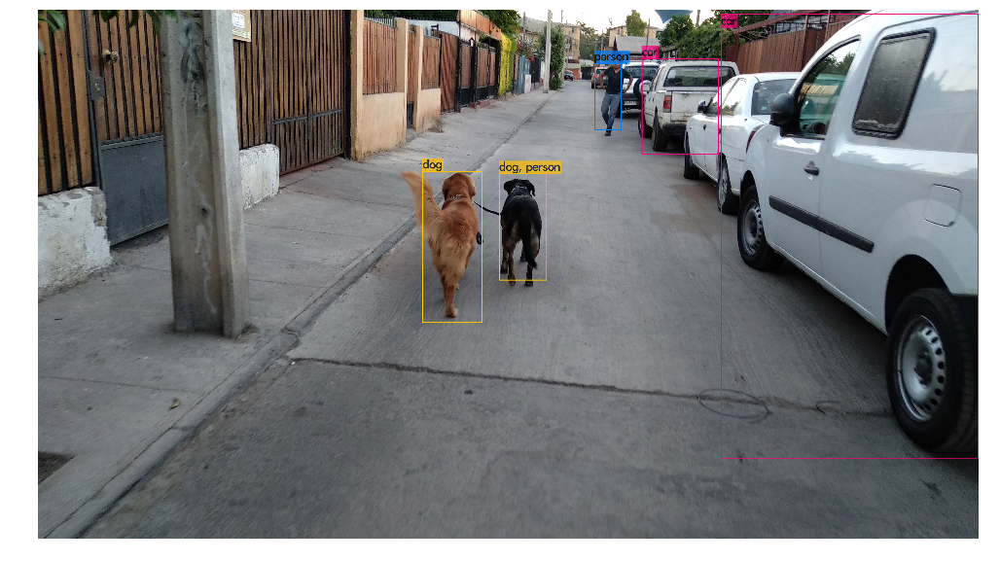

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/dogs-person.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/dogs-person-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/people-far.jpg: Predicted in 22.265000 milli-seconds.
person: 50%
person: 80%
person: 56%
Unable to init server: Could not connect: Connection refused

(predictions:1586): Gtk-WARNING **: 09:32:13.052: cannot open display: 


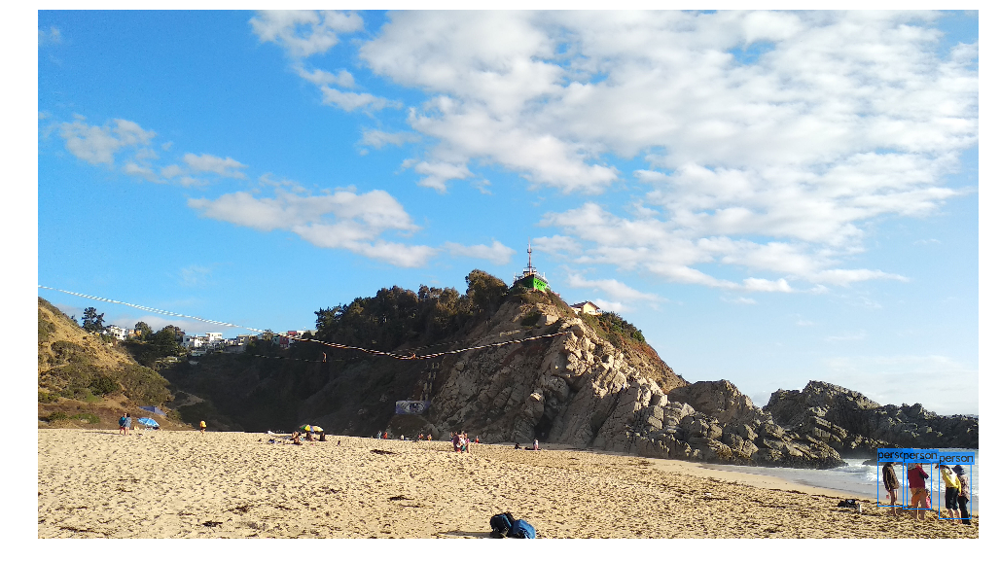

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/people-far.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/people-far-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/people-penguins.jpg: Predicted in 22.294000 milli-seconds.
Unable to init server: Could not connect: Connection refused

(predictions:1627): Gtk-WARNING **: 09:32:19.531: cannot open display: 


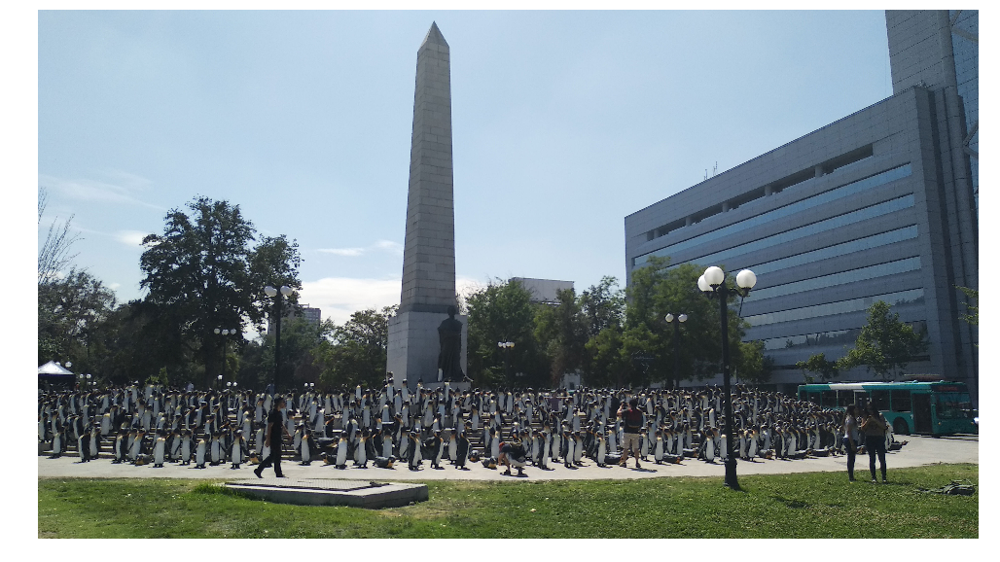

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/people-penguins.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/people-penguins-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/bird.jpg: Predicted in 22.565000 milli-seconds.
bird: 99%
pottedplant: 95%
Unable to init server: Could not connect: Connection refused

(predictions:1721): Gtk-WARNING **: 09:32:26.134: cannot open display: 


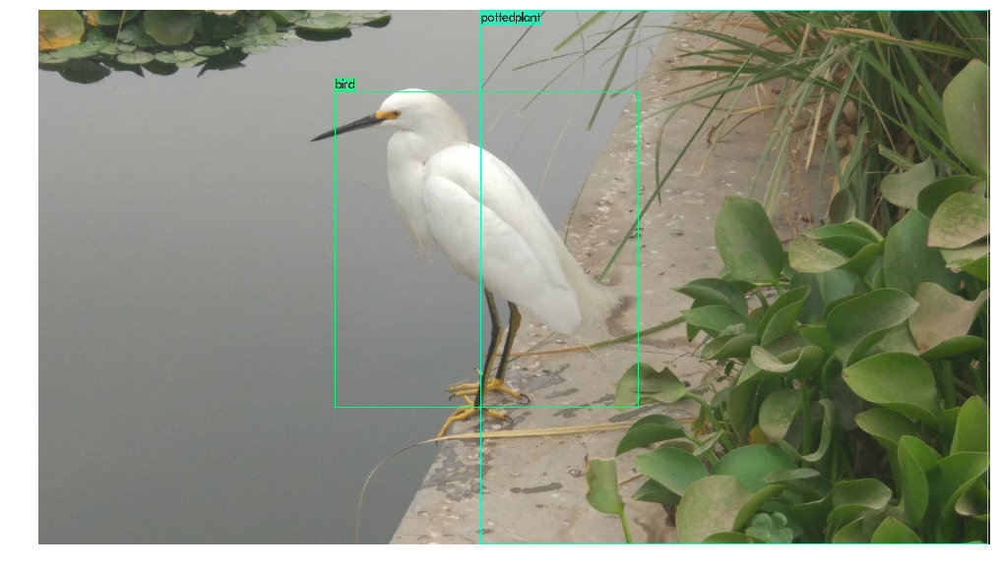

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/bird.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/bird-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

 102 conv    256       3 x 3/ 1     52 x  52 x 128 ->   52 x  52 x 256 1.595 BF
 103 conv    128       1 x 1/ 1     52 x  52 x 256 ->   52 x  52 x 128 0.177 BF
 104 conv    256       3 x 3/ 1     52 x  52 x 128 ->   52 x  52 x 256 1.595 BF
 105 conv     75       1 x 1/ 1     52 x  52 x 256 ->   52 x  52 x  75 0.104 BF
 106 yolo
[yolo] params: iou loss: mse (2), iou_norm: 0.75, cls_norm: 1.00, scale_x_y: 1.00
Total BFLOPS 65.442 
avg_outputs = 520504 
 Allocate additional workspace_size = 13.11 MB 
Loading weights from backup/yolov3-voc_last.weights...
 seen 64, trained: 3212 K-images (50 Kilo-batches_64) 
Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/birds.jpg: Predicted in 22.239000 milli-seconds.
bird: 100%
Unable to init server: Could not connect: Connection refused

(predictions:1753): Gtk-WARNING **: 09:32:33.131: cannot open display: 


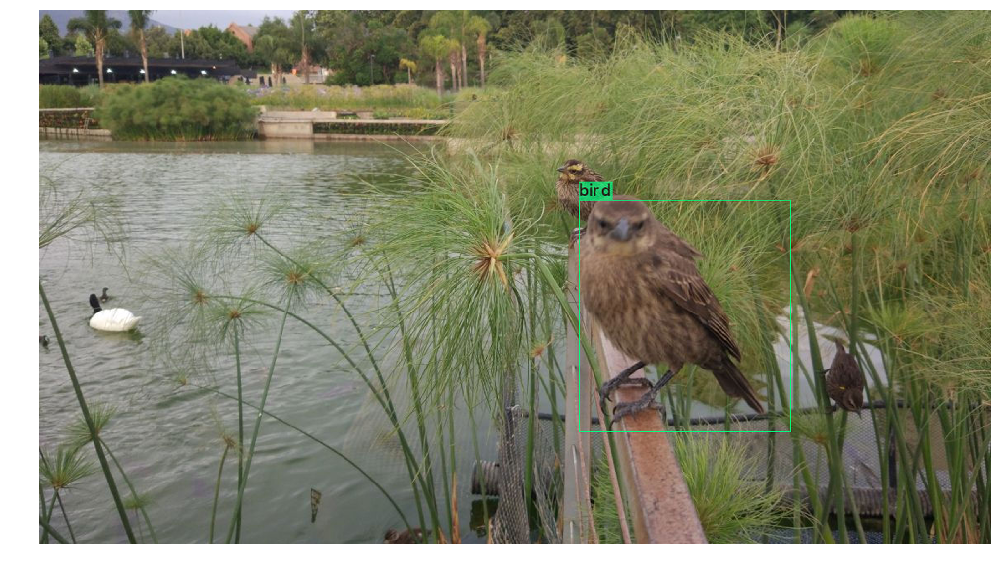

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/birds.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/birds-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/birds-flamingos.jpg: Predicted in 22.366000 milli-seconds.
bird: 96%
bird: 90%
bird: 56%
bird: 43%
bird: 96%
Unable to init server: Could not connect: Connection refused

(predictions:1789): Gtk-WARNING **: 09:32:37.037: cannot open display: 


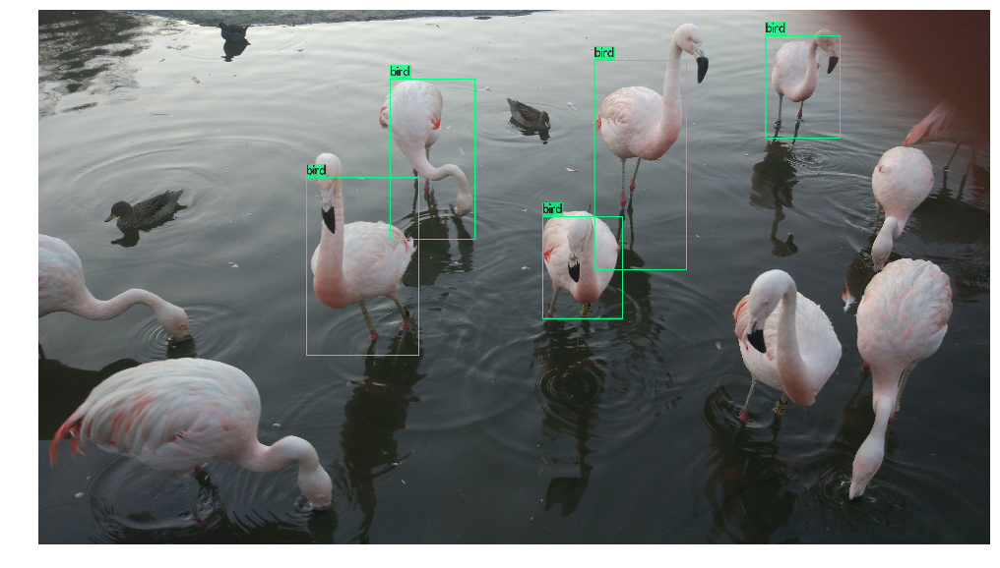

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/birds-flamingos.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/flamingos-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/birds-swans.jpg: Predicted in 22.590000 milli-seconds.
bird: 98%
bird: 36%
bird: 96%
bird: 30%
bird: 58%
bird: 32%
bird: 41%
bird: 35%
Unable to init server: Could not connect: Connection refused

(predictions:1811): Gtk-WARNING **: 09:32:44.737: cannot open display: 


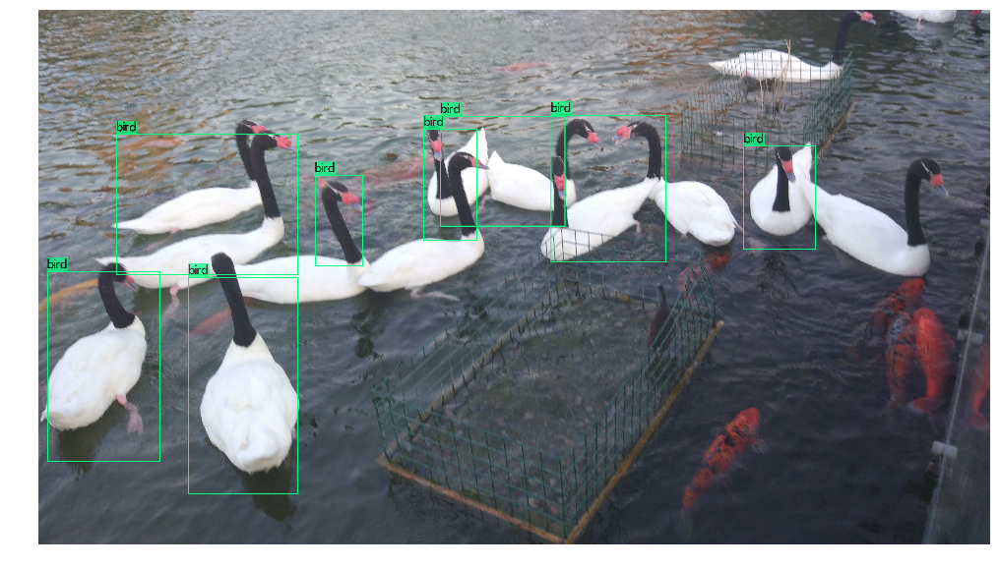

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/birds-swans.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/birds-swans-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/cat-hidden.jpg: Predicted in 22.340000 milli-seconds.
Unable to init server: Could not connect: Connection refused

(predictions:1832): Gtk-WARNING **: 09:32:52.326: cannot open display: 


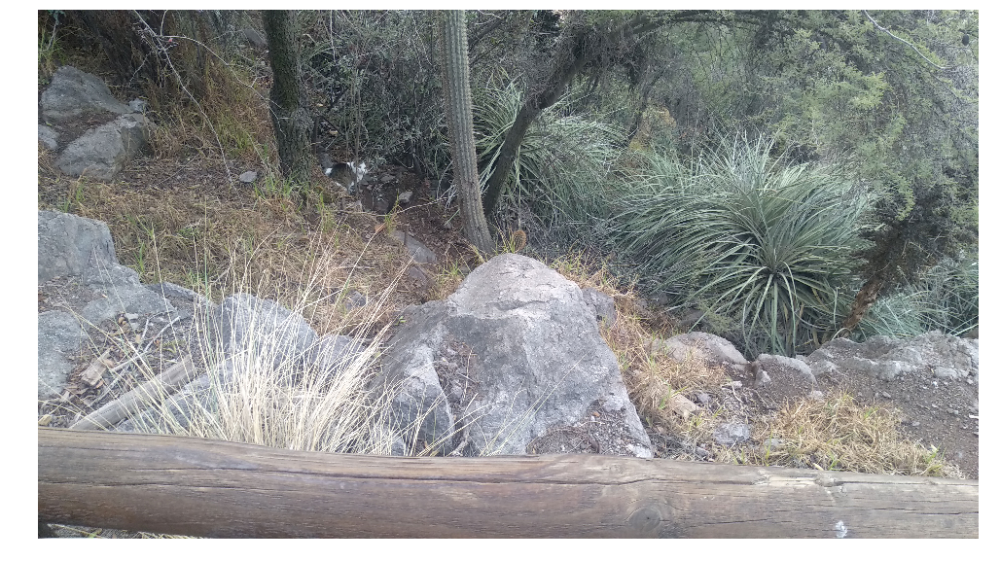

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/cat-hidden.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/cat-hidden-new.jpg

 CUDA-version: 10000 (10010), cuDNN: 7.6.5, GPU count: 2  
 OpenCV version: 4.4.0
 0 : compute_capability = 520, cudnn_half = 0, GPU: GeForce GTX TITAN X 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 

Done! Loaded 107 layers from weights-file 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
pictures/dogs.jpg: Predicted in 22.381000 milli-seconds.
dog: 100%
dog: 100%
Unable to init server: Could not connect: Connection refused

(predictions:1853): Gtk-WARNING **: 09:32:58.903: cannot open display: 


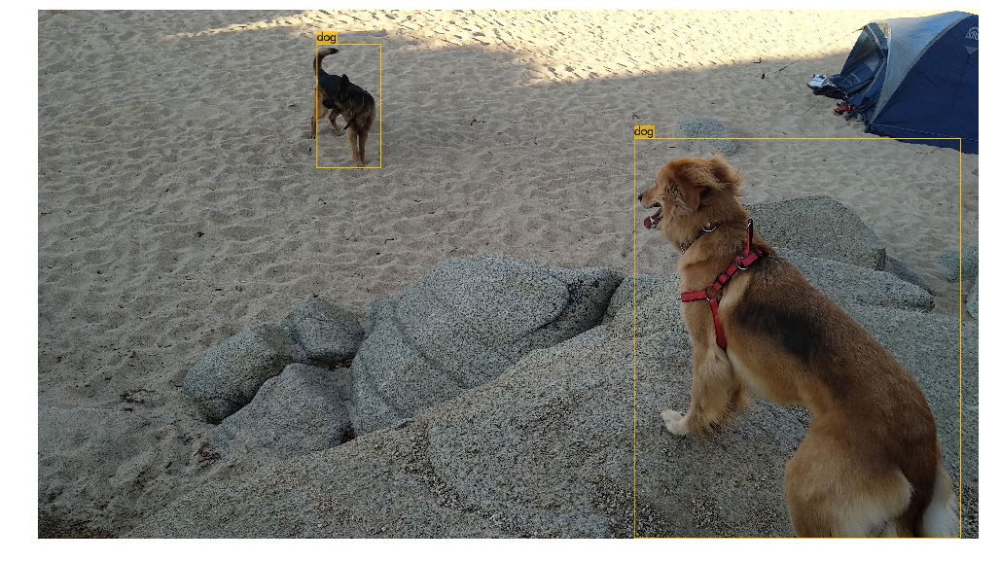

In [ ]:
!./darknet detector test cfg/voc.data cfg/yolov3-voc.cfg backup/yolov3-voc_last.weights pictures/dogs.jpg -thresh 0.3
imShow('predictions.jpg')
!cp predictions.jpg backup/dogs-new.jpg